# Donors Choose KNN

**contents**
1. ..A: Reading data , data preprocesing and preparing data for models 
2. ..B: merging (preparing data matrix)(assignment)
4. ..C: apply knn on given sets(assignment)
4. ..d: apply slectkbest on set2(assignment)

# A. Reading data , data preprocesing and preparing data for models

In [9]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

## A. Reading Data

In [10]:
project_data = pd.read_csv('d_c_traindata.csv')
resource_data = pd.read_csv('resources.csv')


## A1. cleaning Data

In [11]:
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039
# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

catogories = list(project_data['project_subject_categories'].values)
cat_list = []
for i in catogories:
    temp = ""
    
    for j in i.split(','): 
        if 'The' in j.split(): 
            j=j.replace('The','') 
        j = j.replace(' ','') 
        temp+=j.strip()+" "
        temp = temp.replace('&','_') 
    cat_list.append(temp.strip())

In [12]:
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)


In [13]:
# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
# dict sort by value python: https://stackoverflow.com/a/613218/4084039

from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())

cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))



In [14]:

# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_catogories = list(project_data['project_subject_subcategories'].values)
sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

In [15]:
project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)


In [16]:
# dict sort by value python: https://stackoverflow.com/a/613218/4084039
# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
from collections import Counter
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())
    

sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))




In [17]:
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [18]:
# https://stackoverflow.com/questions/22407798/how-to-reset-a-dataframes-indexes-for-all-groups-in-one-step
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()


In [19]:
# join two dataframes in python: 
project_data = pd.merge(project_data, price_data, on='id', how='left')

In [20]:
#https://www.geeksforgeeks.org/python-regex-extract-maximum-numeric-value-string/
#https://stackoverflow.com/questions/19859282/check-if-a-string-contains-a-number

def hasNumbers(inputString):
     return any(char.isdigit() for char in inputString)

def extractMax(input):  
    numbers = re.findall('\d+',input) 
    numbers = map(int,numbers) 
    return  max(numbers) 
  

c = list(project_data['project_resource_summary'].values)
cat_list3 = []
for i in c:
    if(hasNumbers(i)):
        n = extractMax(i)
        cat_list3.append(n)
    else:
        cat_list3.append(0)

project_data['clean_resource_summary'] = cat_list3
project_data.drop(['project_resource_summary'], axis=1, inplace=True)

        


In [21]:
df = project_data['project_is_approved']

In [22]:
project_data.drop(['project_is_approved'], axis=1, inplace=True)

## A2. Data into train ,test and cv

In [23]:
import  sklearn.model_selection as cross_validation
x_1, x_test, y_1, y_test = cross_validation.train_test_split(project_data,df, test_size=0.3, random_state=0)

x_tr, x_cv, y_tr, y_cv = cross_validation.train_test_split(x_1, y_1, test_size=0.3)



In [24]:
# https://stackoverflow.com/a/47091490/4084039
# \r \n \t remove from string python: http://texthandler.com/info/remove-line-breaks-python/
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
#sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase
sent = decontracted(project_data['essay'].values[20000])



sent = sent.replace('\\r', ' ')
sent = sent.replace('\\"', ' ')
sent = sent.replace('\\n', ' ')


sent = re.sub('[^A-Za-z0-9]+', ' ', sent)



stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [25]:
# https://gist.github.com/sebleier/554280
from tqdm import tqdm
preprocessed_essays1 = []
# tqdm is for printing the status bar
for sentance in tqdm(x_test['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_essays1.append(sent.lower().strip())

100%|██████████| 32775/32775 [01:22<00:00, 399.03it/s]


In [26]:
# https://gist.github.com/sebleier/554280
from tqdm import tqdm
preprocessed_essays2 = []
# tqdm is for printing the status bar
for sentance in tqdm(x_tr['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_essays2.append(sent.lower().strip())

100%|██████████| 53531/53531 [01:52<00:00, 476.00it/s]


In [27]:
# https://gist.github.com/sebleier/554280
from tqdm import tqdm
preprocessed_essays3 = []
# tqdm is for printing the status bar
for sentance in tqdm(x_cv['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_essays3.append(sent.lower().strip())

100%|██████████| 22942/22942 [00:39<00:00, 575.07it/s]


In [28]:
# https://gist.github.com/sebleier/554280
from tqdm import tqdm
preprocessed_title1 = []
# tqdm is for printing the status bar
for sentance in tqdm(x_test['project_title'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
   
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_title1.append(sent.lower().strip())

100%|██████████| 32775/32775 [00:02<00:00, 13616.98it/s]


In [29]:
# https://gist.github.com/sebleier/554280
from tqdm import tqdm
preprocessed_title2 = []
# tqdm is for printing the status bar
for sentance in tqdm(x_tr['project_title'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
   
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_title2.append(sent.lower().strip())

100%|██████████| 53531/53531 [00:04<00:00, 11527.61it/s]


In [30]:
# https://gist.github.com/sebleier/554280
from tqdm import tqdm
preprocessed_title3 = []
# tqdm is for printing the status bar
for sentance in tqdm(x_cv['project_title'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
   
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_title3.append(sent.lower().strip())

100%|██████████| 22942/22942 [00:02<00:00, 10265.60it/s]


## A.3  one hot encoding of categorical data

In [31]:
#https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html
# we use count vectorizer to convert the values into one hot encoded features
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(vocabulary=list(sorted_cat_dict.keys()), lowercase=False, binary=True)
vectorizer.fit(x_tr['school_state'].values)

school_one_hot_cv = vectorizer.transform(x_cv['school_state'].values)
school_one_hot_test = vectorizer.transform(x_test['school_state'].values)
school_one_hot_tr = vectorizer.transform(x_tr['school_state'].values)
ss = vectorizer.get_feature_names()

In [32]:
#https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html
# we use count vectorizer to convert the values into one hot encoded features
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(vocabulary=list(sorted_cat_dict.keys()), lowercase=False, binary=True)
vectorizer.fit(x_tr['clean_categories'].values)


categories_one_hot_cv = vectorizer.transform(x_cv['clean_categories'].values)

categories_one_hot_test = vectorizer.transform(x_test['clean_categories'].values)
categories_one_hot_tr = vectorizer.transform(x_tr['clean_categories'].values)
cc = vectorizer.get_feature_names()

In [33]:
#https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html
# we use count vectorizer to convert the values into one hot encoded features
vectorizer = CountVectorizer(vocabulary=list(sorted_sub_cat_dict.keys()), lowercase=False, binary=True)
vectorizer.fit(x_tr['clean_subcategories'].values)


sub_categories_one_hot_test = vectorizer.transform(x_test['clean_subcategories'].values)
sub_categories_one_hot_cv = vectorizer.transform(x_cv['clean_subcategories'].values)
sub_categories_one_hot_tr = vectorizer.transform(x_tr['clean_subcategories'].values)
csc = vectorizer.get_feature_names()

In [34]:
#https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html
# we use count vectorizer to convert the values into one hot encoded features
vectorizer = CountVectorizer(vocabulary=list(sorted_sub_cat_dict.keys()), lowercase=False, binary=True)
vectorizer.fit(x_tr['project_grade_category'].values)

project_one_hot_test = vectorizer.transform(x_test['project_grade_category'].values)

project_one_hot_cv = vectorizer.transform(x_cv['project_grade_category'].values)
project_one_hot_tr = vectorizer.transform(x_tr['project_grade_category'].values)
pgc = vectorizer.get_feature_names()

In [35]:
#https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html
vectorizer = CountVectorizer(vocabulary=list(sorted_sub_cat_dict.keys()), lowercase=False,binary=True)
vectorizer.fit(x_tr['teacher_prefix'].values.astype('str'))

teacher_one_hot_test = vectorizer.transform(x_test['teacher_prefix'].values.astype('str'))
teacher_one_hot_cv = vectorizer.transform(x_cv['teacher_prefix'].values.astype('str'))
teacher_one_hot_tr = vectorizer.transform(x_tr['teacher_prefix'].values.astype('str'))
tp = vectorizer.get_feature_names()

## A.4 vectorizing text  Data 

In [36]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [37]:
vectorizer = CountVectorizer(min_df=10)
vectorizer.fit(preprocessed_essays2)
text_bow_e_cv = vectorizer.transform(preprocessed_essays3)
text_bow_e_test = vectorizer.transform(preprocessed_essays1)
text_bow_e_tr = vectorizer.transform(preprocessed_essays2)


In [38]:

tbe = vectorizer.get_feature_names()

In [39]:
print(text_bow_e_test.shape)
print(text_bow_e_tr.shape)
print(text_bow_e_cv.shape)

(32775, 12582)
(53531, 12582)
(22942, 12582)


In [40]:

vectorizer = CountVectorizer(min_df=10)
vectorizer.fit(preprocessed_title2)
text_bow_t_cv = vectorizer.transform(preprocessed_title3)
text_bow_t_test = vectorizer.transform(preprocessed_title1)
text_bow_t_tr = vectorizer.transform(preprocessed_title2)

tbt = vectorizer.get_feature_names()

In [41]:
print(text_bow_t_test.shape)
print(text_bow_t_tr.shape)
print(text_bow_t_cv.shape)

(32775, 2210)
(53531, 2210)
(22942, 2210)


In [42]:

vectorizer = TfidfVectorizer(min_df=10)
vectorizer.fit(preprocessed_essays2)
text_tfidf_e_tr = vectorizer.transform(preprocessed_essays2)
text_tfidf_e_cv = vectorizer.transform(preprocessed_essays3)
text_tfidf_e_test = vectorizer.transform(preprocessed_essays1)
tte = vectorizer.get_feature_names()

In [43]:
print(text_tfidf_e_cv.shape)
print(text_tfidf_e_tr.shape)
print(text_tfidf_e_test.shape)

(22942, 12582)
(53531, 12582)
(32775, 12582)


In [44]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=10)
vectorizer.fit(preprocessed_title2)
text_tfidf_t_tr = vectorizer.transform(preprocessed_title2)
text_tfidf_t_cv = vectorizer.transform(preprocessed_title3)
text_tfidf_t_test = vectorizer.transform(preprocessed_title1)
ttt = vectorizer.get_feature_names()

In [45]:
print(text_tfidf_t_cv.shape)
print(text_tfidf_t_tr.shape)
print(text_tfidf_t_test.shape)

(22942, 2210)
(53531, 2210)
(32775, 2210)


In [46]:
#http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

In [47]:
#http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors_test = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_essays1): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_test.append(vector)



100%|██████████| 32775/32775 [00:40<00:00, 801.32it/s]


In [48]:
#http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors_tr = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_essays2): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_tr.append(vector)


    
    
    

100%|██████████| 53531/53531 [00:56<00:00, 945.52it/s]


In [49]:
#http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors_cv = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_essays3): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_cv.append(vector)



100%|██████████| 22942/22942 [00:23<00:00, 993.25it/s] 


In [50]:
avg_w2v_vectors_e_test = pd.DataFrame(avg_w2v_vectors_test)

In [51]:
avg_w2v_vectors_e_tr = pd.DataFrame(avg_w2v_vectors_tr)

In [52]:
avg_w2v_vectors_e_cv = pd.DataFrame(avg_w2v_vectors_cv)

In [53]:
avg_w2v_vectors_e_test.shape

(32775, 300)

In [54]:
avg_w2v_vectors_e_tr.shape

(53531, 300)

In [55]:
avg_w2v_vectors_e_cv.shape

(22942, 300)

In [56]:
#http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors_t_test = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_title1): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split():
        # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_t_test.append(vector)


100%|██████████| 32775/32775 [00:01<00:00, 18768.78it/s]


In [57]:
#http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors_t_tr = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_title2): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split():
        # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_t_tr.append(vector)


100%|██████████| 53531/53531 [00:02<00:00, 19169.72it/s]


In [58]:
#http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors_t_cv = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_title3): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split():
        # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_t_cv.append(vector)


100%|██████████| 22942/22942 [00:01<00:00, 13730.26it/s]


In [59]:
avg_w2v_vectors_t_test = pd.DataFrame(avg_w2v_vectors_t_test)

In [60]:
avg_w2v_vectors_t_tr = pd.DataFrame(avg_w2v_vectors_t_tr)

In [61]:
avg_w2v_vectors_t_cv = pd.DataFrame(avg_w2v_vectors_t_cv)

In [62]:
#http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
tfidf_model = TfidfVectorizer()
tfidf_model.fit(preprocessed_essays2)

dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

tfidf_w2v_vectors_e_test = []; 
for sentence in tqdm(preprocessed_essays1): 
    vector = np.zeros(300) 
    tf_idf_weight =0; 
    for word in sentence.split(): 
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] 
            
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split()))
            vector += (vec * tf_idf) 
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_e_test.append(vector)




100%|██████████| 32775/32775 [04:06<00:00, 133.17it/s]


In [63]:
#http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
tfidf_w2v_vectors_e_tr = []; 
for sentence in tqdm(preprocessed_essays2): 
    vector = np.zeros(300) 
    tf_idf_weight =0; 
    for word in sentence.split(): 
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] 
            
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split()))
            vector += (vec * tf_idf) 
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_e_tr.append(vector)



100%|██████████| 53531/53531 [06:16<00:00, 142.17it/s]


In [64]:
#http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
tfidf_w2v_vectors_e_cv = []; 
for sentence in tqdm(preprocessed_essays3): 
    vector = np.zeros(300) 
    tf_idf_weight =0; 
    for word in sentence.split(): 
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] 
            
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split()))
            vector += (vec * tf_idf) 
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_e_cv.append(vector)



100%|██████████| 22942/22942 [02:28<00:00, 154.16it/s]


In [65]:
tfidf_w2v_vectors_e_test =pd.DataFrame(tfidf_w2v_vectors_e_test)

In [66]:
tfidf_w2v_vectors_e_tr =pd.DataFrame(tfidf_w2v_vectors_e_tr)

In [67]:
tfidf_w2v_vectors_e_cv =pd.DataFrame(tfidf_w2v_vectors_e_cv)

In [68]:
tfidf_w2v_vectors_e_test.shape

(32775, 300)

In [69]:
tfidf_w2v_vectors_e_tr.shape

(53531, 300)

In [70]:
tfidf_w2v_vectors_e_cv.shape

(22942, 300)

In [71]:
#http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
tfidf_model = TfidfVectorizer()
tfidf_model.fit(preprocessed_title2)

dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())
tfidf_w2v_vectors_t_test = []; 
for sentence in tqdm(preprocessed_title1): 
    vector = np.zeros(300) 
    tf_idf_weight =0; 
    for word in sentence.split(): 
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] 
          
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) 
            vector += (vec * tf_idf)
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_t_test.append(vector)



100%|██████████| 32775/32775 [00:03<00:00, 8487.69it/s]


In [72]:
#http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

tfidf_w2v_vectors_t_tr = []; 
for sentence in tqdm(preprocessed_title2): 
    vector = np.zeros(300) 
    tf_idf_weight =0; 
    for word in sentence.split(): 
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] 
          
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) 
            vector += (vec * tf_idf)
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_t_tr.append(vector)



100%|██████████| 53531/53531 [00:04<00:00, 11117.38it/s]


In [73]:
#http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
tfidf_w2v_vectors_t_cv = []; 
for sentence in tqdm(preprocessed_title3): 
    vector = np.zeros(300) 
    tf_idf_weight =0; 
    for word in sentence.split(): 
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] 
          
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) 
            vector += (vec * tf_idf)
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_t_cv.append(vector)


100%|██████████| 22942/22942 [00:02<00:00, 9018.57it/s] 


In [74]:
tfidf_w2v_vectors_t_test =pd.DataFrame(tfidf_w2v_vectors_t_test)

In [75]:
tfidf_w2v_vectors_t_tr =pd.DataFrame(tfidf_w2v_vectors_t_tr)

In [76]:
tfidf_w2v_vectors_t_cv =pd.DataFrame(tfidf_w2v_vectors_t_cv)

In [77]:
tfidf_w2v_vectors_t_test.shape

(32775, 300)

In [78]:
tfidf_w2v_vectors_t_tr.shape

(53531, 300)

In [79]:
tfidf_w2v_vectors_t_cv.shape

(22942, 300)

## A.5 standardizing numerical Data

In [80]:
#https://www.youtube.com/watch?v=0HOqOcln3Z4&t=530s
#https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html

from sklearn.preprocessing import StandardScaler
price_scalar = StandardScaler()
price_scalar.fit(x_tr['price'].values.reshape(-1,1),) # finding the mean and standard deviation of this data

price_standardized_test = price_scalar.transform(x_test['price'].values.reshape(-1, 1))
price_standardized_tr = price_scalar.transform(x_tr['price'].values.reshape(-1, 1))
price_standardized_cv = price_scalar.transform(x_cv['price'].values.reshape(-1, 1))
ps = ['price']

In [81]:
price_standardized_test.shape

(32775, 1)

In [82]:
price_standardized_tr.shape

(53531, 1)

In [83]:
price_standardized_cv.shape

(22942, 1)

In [84]:
#https://www.youtube.com/watch?v=0HOqOcln3Z4&t=530s
#https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html

from sklearn.preprocessing import StandardScaler
price_scalar = StandardScaler()
price_scalar.fit(x_tr['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)) # finding the mean and standard deviation of this data

teacher_standardized_tr = price_scalar.transform(x_tr['price'].values.reshape(-1, 1))
teacher_standardized_test = price_scalar.transform(x_test['price'].values.reshape(-1, 1))
teacher_standardized_cv = price_scalar.transform(x_cv['price'].values.reshape(-1, 1))
ts = ['noofteacherprops']

In [85]:
teacher_standardized_tr.shape

(53531, 1)

In [86]:
teacher_standardized_test.shape

(32775, 1)

In [87]:
teacher_standardized_cv.shape

(22942, 1)

 # B. merging (preparing data matrix)(assignment)

In [88]:
#https://www.kaggle.com/c/quora-question-pairs/discussion/33491
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
da = hstack((price_standardized_test,teacher_standardized_test,categories_one_hot_test, sub_categories_one_hot_test, text_bow_t_test,text_bow_e_test ,school_one_hot_test,teacher_one_hot_test,project_one_hot_test,)).tocsr()
da.shape

(32775, 14902)

In [89]:
f2 =  cc + csc +tbt +tbe +ps +ss +tp+pgc+ts

In [90]:
#https://www.kaggle.com/c/quora-question-pairs/discussion/33491
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
da1 = hstack((categories_one_hot_tr, sub_categories_one_hot_tr, text_bow_t_tr,text_bow_e_tr ,price_standardized_tr,school_one_hot_tr,teacher_one_hot_tr,project_one_hot_tr,teacher_standardized_tr)).tocsr()
da1.shape

(53531, 14902)

In [91]:
#https://www.kaggle.com/c/quora-question-pairs/discussion/33491
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
da2 = hstack((categories_one_hot_cv, sub_categories_one_hot_cv, text_bow_t_cv,text_bow_e_cv ,price_standardized_cv,school_one_hot_cv,teacher_one_hot_cv,project_one_hot_cv,teacher_standardized_cv)).tocsr()
da2.shape


(22942, 14902)

In [92]:
da_tr = da1

In [93]:
da_test = da


In [94]:
da_cv = da2

In [95]:
#https://www.kaggle.com/c/quora-question-pairs/discussion/33491
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
db1 = hstack((categories_one_hot_tr, sub_categories_one_hot_tr, text_tfidf_t_tr,text_tfidf_e_tr, price_standardized_tr,school_one_hot_tr,teacher_one_hot_tr,project_one_hot_tr,teacher_standardized_tr)).tocsr()
db1.shape

(53531, 14902)

In [96]:
f3 =  cc + csc +ttt +tte +ps +ss +tp+pgc+ts

In [200]:
db_tr = db1

In [98]:
#https://www.kaggle.com/c/quora-question-pairs/discussion/33491
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
db2 = hstack(( price_standardized_test,teacher_standardized_test,categories_one_hot_test, sub_categories_one_hot_test, text_tfidf_t_test,text_tfidf_e_test,school_one_hot_test,teacher_one_hot_test,project_one_hot_test)).tocsr()
db2.shape

(32775, 14902)

In [201]:
db_test = db2


In [100]:
#https://www.kaggle.com/c/quora-question-pairs/discussion/33491
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
db3 = hstack((categories_one_hot_cv, sub_categories_one_hot_cv, text_tfidf_t_cv,text_tfidf_e_cv, price_standardized_cv,school_one_hot_cv,teacher_one_hot_cv,project_one_hot_cv,teacher_standardized_cv)).tocsr()
db3.shape

(22942, 14902)

In [202]:
db_cv = db3

In [102]:
#https://www.kaggle.com/c/quora-question-pairs/discussion/33491
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
dc1 = hstack((categories_one_hot_tr, sub_categories_one_hot_tr, avg_w2v_vectors_t_tr,avg_w2v_vectors_e_tr, price_standardized_tr,school_one_hot_tr,teacher_one_hot_tr,project_one_hot_tr,teacher_standardized_tr)).tocsr()
dc1.shape

(53531, 710)

In [103]:
#https://www.kaggle.com/c/quora-question-pairs/discussion/33491
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
dc2 = hstack(( price_standardized_test,teacher_standardized_test,categories_one_hot_test, sub_categories_one_hot_test, avg_w2v_vectors_t_test,avg_w2v_vectors_e_test,school_one_hot_test,teacher_one_hot_test,project_one_hot_test)).tocsr()
dc2.shape

(32775, 710)

In [104]:
#https://www.kaggle.com/c/quora-question-pairs/discussion/33491
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
dc3 = hstack((categories_one_hot_cv, sub_categories_one_hot_cv, avg_w2v_vectors_t_cv,avg_w2v_vectors_e_cv, price_standardized_cv,school_one_hot_cv,teacher_one_hot_cv,project_one_hot_cv,teacher_standardized_cv)).tocsr()
dc3.shape

(22942, 710)

In [105]:
dc_tr = dc1

In [106]:
dc_test = dc2

In [107]:
dc_cv = dc3

In [108]:
#https://www.kaggle.com/c/quora-question-pairs/discussion/33491
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
dd1 = hstack((categories_one_hot_tr, sub_categories_one_hot_tr, tfidf_w2v_vectors_t_tr,tfidf_w2v_vectors_e_tr, price_standardized_tr,school_one_hot_tr,teacher_one_hot_tr,project_one_hot_tr,teacher_standardized_tr)).tocsr()
dd1.shape

(53531, 710)

In [109]:
#https://www.kaggle.com/c/quora-question-pairs/discussion/33491
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)_test
dd2 = hstack((price_standardized_test,teacher_standardized_test,categories_one_hot_test, sub_categories_one_hot_test, tfidf_w2v_vectors_t_test,tfidf_w2v_vectors_e_test, school_one_hot_test,teacher_one_hot_test,project_one_hot_test,)).tocsr()
dd2.shape

(32775, 710)

In [110]:
#https://www.kaggle.com/c/quora-question-pairs/discussion/33491
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
dd3 = hstack((categories_one_hot_cv, sub_categories_one_hot_cv, tfidf_w2v_vectors_t_cv,tfidf_w2v_vectors_e_cv, price_standardized_cv,school_one_hot_cv,teacher_one_hot_cv,project_one_hot_cv,teacher_standardized_cv)).tocsr()
dd3.shape

(22942, 710)

In [111]:
dd_tr = dd1

In [112]:
dd_test = dd2

In [113]:
dd_cv = dd3

In [114]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets, neighbors
from mlxtend.plotting import plot_decision_regions
import pandas as pd

In [115]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets, neighbors
# https://anaconda.org/conda-forge/mlxtend
from mlxtend.plotting import plot_decision_regions
import pandas as pd
from matplotlib.colors import ListedColormap
from sklearn.neighbors import KNeighborsClassifier

In [116]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from collections import Counter
from sklearn.metrics import accuracy_score
from sklearn import model_selection
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot
import matplotlib.pyplot as plt
from mlxtend.evaluate import confusion_matrix
from mlxtend.plotting import plot_confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from wordcloud import WordCloud

# C: apply knn

### C.1 Applying KNN brute force on BOW,<font color='red'> SET 1</font>


CV accuracy for alpha = 1.000000 is 84%
auc on cv 0.5475538931578796
auc on train 0.5530056300423182

CV accuracy for alpha = 5.000000 is 84%
auc on cv 0.6020000087079949
auc on train 0.6323036707385723

CV accuracy for alpha = 10.000000 is 84%
auc on cv 0.6265370777089017
auc on train 0.6926730771620748

CV accuracy for alpha = 50.000000 is 78%
auc on cv 0.5453674478360011
auc on train 0.9310395975800437

CV accuracy for alpha = 100.000000 is 76%
auc on cv 0.5160172290787315
auc on train 0.9886925361929437

CV accuracy for alpha = 500.000000 is 76%
auc on cv 0.5342222641035306
auc on train 0.9991703474052485


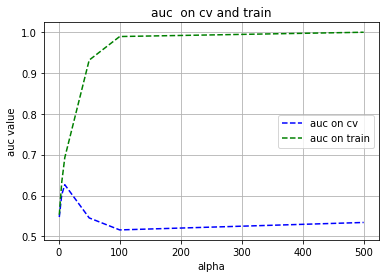

In [117]:
#https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html
#https://stackoverflow.com/questions/38015181/accuracy-score-valueerror-cant-handle-mix-of-binary-and-continuous-target
#https://matplotlib.org/api/pyplot_api.html
#https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html
x = da_tr[0:30000:]
y =  y_tr.values[0:30000] 
k = []
auc_cv = []
auc_tr = []
m = [1, 5, 10, 50, 100, 500]
for i in m:
    k.append(i)
    # instantiate learning model (k = 30)
    knn = DecisionTreeClassifier(max_depth=i,min_samples_split=5)
   
    knn.fit(x, y)

    
    pred = knn.predict(da_cv[0:10000:])
    acc = accuracy_score(y_cv[0:10000:], pred, normalize=True) * float(100)
    print('\nCV accuracy for alpha = %f is %d%%' % (i, acc))
    
    
    
    
    probs = knn.predict_proba(da_cv[0:10000])
    probs = probs[:, 1]
    auc = roc_auc_score(y_cv[0:10000], probs)
    print('auc on cv', auc)
    auc_cv.append(auc)
    
    probs1 = knn.predict_proba(da_tr[0:30000])
    probs1 = probs1[:, 1]
    auc1 = roc_auc_score(y_tr[0:30000], probs1)
    print('auc on train',auc1)
    auc_tr.append(auc1)


plt.plot(k, auc_cv, 'b--', label='auc on cv')#   'rs',   'g^')
plt.plot(k,auc_tr, 'g--', label='auc on train')
plt.grid()
plt.ylabel("auc value")
plt.xlabel('alpha')
plt.title('auc  on cv and train')
plt.legend() # add legend based on line labels
plt.show()


**observations**
1. since i have taken very less points(500) there will be less auc and moreover there is about only 15% of 0 classlabels 
2. above count values says that hyperparametre is taken as 17 and auc on cv is 0.637

In [120]:
import seaborn as sn

acc on train 85.95
acc on test 84.00666666666666
auc on train 0.6926730771620748
auc on test 0.5024997297792552


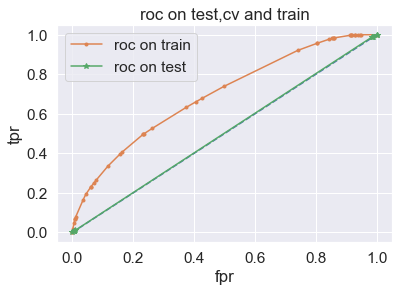

confision matrix on test
confision matrix on train


ValueError: DataFrame constructor not properly called!

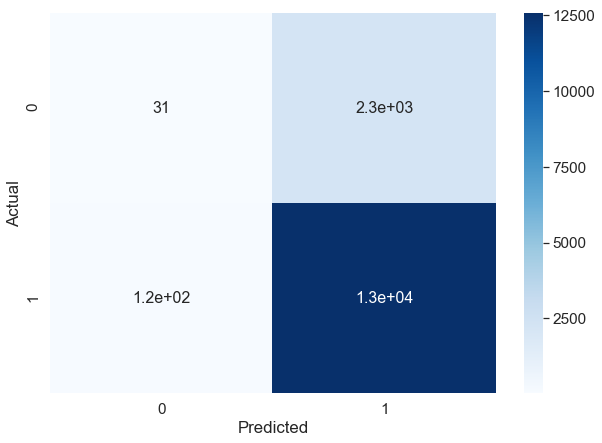

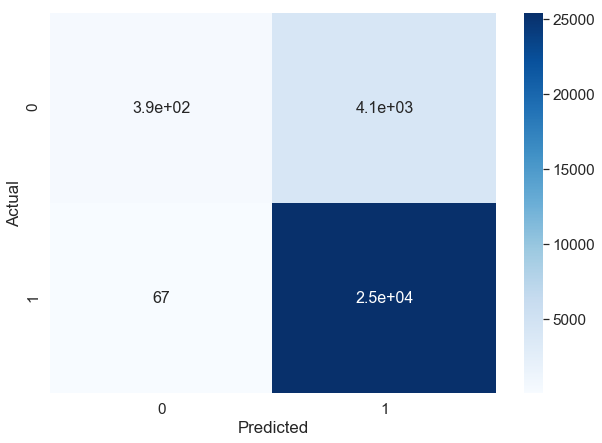

In [126]:
#https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html
#https://stackoverflow.com/questions/38015181/accuracy-score-valueerror-cant-handle-mix-of-binary-and-continuous-target
#https://matplotlib.org/api/pyplot_api.html
#https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html
x = da_tr[0:30000:]
y =  y_tr.values[0:30000] 
knn = DecisionTreeClassifier(max_depth=10,min_samples_split=5)
   
knn.fit(x, y)

pred1 = knn.predict(da_tr[0:30000:])
acc2 = accuracy_score(y_tr[0:30000:], pred1, normalize=True) * float(100)
print('acc on train' ,acc2)

pred2 = knn.predict(da_test[0:15000:])
acc2 = accuracy_score(y_test[0:15000:], pred2, normalize=True) * float(100)
print('acc on test' ,acc2)






probs1 = knn.predict_proba(da_tr[0:30000])
probs1 = probs1[:, 1]
auc1 = roc_auc_score(y_tr[0:30000], probs1)
print('auc on train',auc1)

probs2 = knn.predict_proba(da_test[0:15000])
probs2 = probs2[:, 1]
auc1 = roc_auc_score(y_test[0:15000], probs2)
print('auc on test',auc1)






fpr1, tpr1, thresholds1 = roc_curve(y_tr[0:30000], probs1)
fpr2, tpr2, thresholds2 = roc_curve(y_test[0:15000], probs2)


pyplot.plot([0, 1], [0, 1], linestyle='--')

pyplot.plot(fpr1, tpr1, marker='.', label='roc on train')
pyplot.plot(fpr2, tpr2, marker='*', label='roc on test')

plt.ylabel("tpr")
plt.xlabel('fpr')
plt.title('roc on test,cv and train')
plt.legend()
pyplot.show()


print('confision matrix on test')
data = confusion_matrix(y_test[0:15000], pred2)
df_cm = pd.DataFrame(data, columns=np.unique(y_test[0:15000]), index = np.unique(y_test[0:15000]))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, cmap="Blues", annot=True,annot_kws={"size": 16})# font size

print('confision matrix on train')
data = confusion_matrix(y_tr[0:30000], pred1)
df_cm = pd.DataFrame(data, columns=np.unique(y_tr[0:30000]), index = np.unique(y_tr[0:30000]))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, cmap="Blues", annot=True,annot_kws={"size": 16})# font size

p = da_test[0:15000:][(y_test[0:15000] == 0) & (pred2.T == 1)]
dv = pd.DataFrame(p)
print(dv.shape)

wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white',  
                min_font_size = 10).generate(p)
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 
 






plt.boxplot([dv[0].values])
plt.title('Box Plot of price for fp  ')
plt.ylabel('Price')
plt.grid()
plt.show()

plt.figure(figsize=(10,3))
sns.distplot(dv[1].values, hist=False, label="Fps")
plt.title('no of previous proposals for FPs')
plt.xlabel('no of previous proposals ')
plt.legend()
plt.show()




In [145]:
p = da_test[0:15000:][(y_test[0:15000] == 0) & (pred2.T == 1)]


AttributeError: type not found

In [ ]:
dv = pd.DataFrame(data=p)

In [111]:
#https://towardsdatascience.com/how-to-visualize-a-decision-tree-from-a-random-forest-in-python-using-scikit-learn-38ad2d75f21c
from sklearn import tree
x = da_tr[0:30000:]
y =  y_tr.values[0:30000] 
knn = DecisionTreeClassifier(max_depth=10,min_samples_split=5)
knn.fit(x, y)
tree.export_graphviz(knn,out_file='tree.dot',feature_names=f2)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])
from IPython.display import Image
Image(filename = 'tree.png')

**observation**
1. from the above roc curves auc on train 0.6618358987090367,auc on test 0.5778259299386059,auc on cv 0.6379339400067409
2. from above confusion matrix tp = 429 and fp = 71 

### C.2 Applying KNN brute force on TFIDF,<font color='red'> SET 2</font>


CV accuracy for alpha = 1.000000 is 84%
auc on cv 0.5500423581747546
auc on train 0.5503051428032177

CV accuracy for alpha = 5.000000 is 84%
auc on cv 0.6074053409864166
auc on train 0.6313248661431328

CV accuracy for alpha = 10.000000 is 83%
auc on cv 0.6130753341071009
auc on train 0.6918595349566283

CV accuracy for alpha = 50.000000 is 79%
auc on cv 0.5203615077395414
auc on train 0.8909254032634257

CV accuracy for alpha = 100.000000 is 77%
auc on cv 0.4995343166525473
auc on train 0.9618184076382164

CV accuracy for alpha = 500.000000 is 75%
auc on cv 0.5308087690129736
auc on train 0.9994325274394159


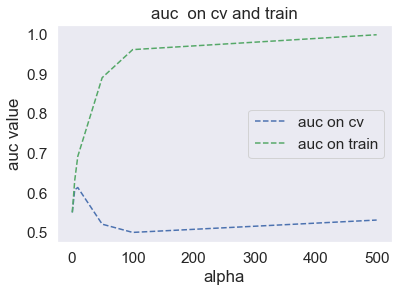

In [132]:
#https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html
#https://stackoverflow.com/questions/38015181/accuracy-score-valueerror-cant-handle-mix-of-binary-and-continuous-target
#https://matplotlib.org/api/pyplot_api.html
#https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html
x = db_tr[0:30000:]
y =  y_tr.values[0:30000] 
k = []
auc_cv = []
auc_tr = []
m = [1, 5, 10, 50, 100, 500]
for i in m:
    k.append(i)
    # instantiate learning model (k = 30)
    knn = DecisionTreeClassifier(max_depth=i,min_samples_split=5)
   
    knn.fit(x, y)

    
    pred = knn.predict(db_cv[0:10000:])
    acc = accuracy_score(y_cv[0:10000:], pred, normalize=True) * float(100)
    print('\nCV accuracy for alpha = %f is %d%%' % (i, acc))
    
    
    
    
    probs = knn.predict_proba(db_cv[0:10000])
    probs = probs[:, 1]
    auc = roc_auc_score(y_cv[0:10000], probs)
    print('auc on cv', auc)
    auc_cv.append(auc)
    
    probs1 = knn.predict_proba(db_tr[0:30000])
    probs1 = probs1[:, 1]
    auc1 = roc_auc_score(y_tr[0:30000], probs1)
    print('auc on train',auc1)
    auc_tr.append(auc1)


plt.plot(k, auc_cv, 'b--', label='auc on cv')#   'rs',   'g^')
plt.plot(k,auc_tr, 'g--', label='auc on train')
plt.grid()
plt.ylabel("auc value")
plt.xlabel('alpha')
plt.title('auc  on cv and train')
plt.legend() # add legend based on line labels
plt.show()


**observations**
1. since i have taken very less points(500) there will be less auc and moreover there is about only 15% of 0 classlabels 
2. above count values says that hyperparametre is taken as 27 and auc on cv is 0.56

acc on test 83.99333333333333
auc on train 0.6901755014592698
auc on test 0.5067081360425827


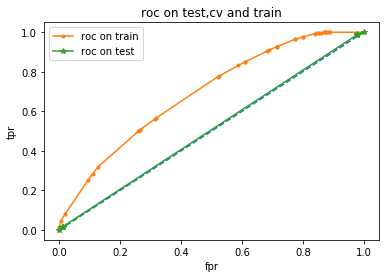

confision matrix on test
[[   47  2259]
 [  142 12552]]
2259
(2259, 14913)


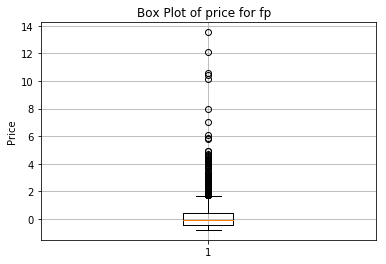

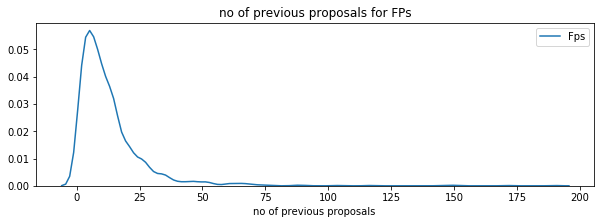

In [113]:
#https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html
#https://stackoverflow.com/questions/38015181/accuracy-score-valueerror-cant-handle-mix-of-binary-and-continuous-target
#https://matplotlib.org/api/pyplot_api.html
#https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html
x = db_tr[0:30000:]
y =  y_tr.values[0:30000] 
knn = DecisionTreeClassifier(max_depth=10,min_samples_split=5)
   
knn.fit(x, y)



pred2 = knn.predict(db_test[0:15000:])
acc2 = accuracy_score(y_test[0:15000:], pred2, normalize=True) * float(100)
print('acc on test' ,acc2)






probs1 = knn.predict_proba(db_tr[0:30000])
probs1 = probs1[:, 1]
auc1 = roc_auc_score(y_tr[0:30000], probs1)
print('auc on train',auc1)

probs2 = knn.predict_proba(db_test[0:15000])
probs2 = probs2[:, 1]
auc1 = roc_auc_score(y_test[0:15000], probs2)
print('auc on test',auc1)






fpr1, tpr1, thresholds1 = roc_curve(y_tr[0:30000], probs1)
fpr2, tpr2, thresholds2 = roc_curve(y_test[0:15000], probs2)


pyplot.plot([0, 1], [0, 1], linestyle='--')

pyplot.plot(fpr1, tpr1, marker='.', label='roc on train')
pyplot.plot(fpr2, tpr2, marker='*', label='roc on test')

plt.ylabel("tpr")
plt.xlabel('fpr')
plt.title('roc on test,cv and train')
plt.legend()
pyplot.show()


print('confision matrix on test')
data = confusion_matrix(y_test[0:15000], pred2)
df_cm = pd.DataFrame(data, columns=np.unique(y_test[0:15000]), index = np.unique(y_test[0:15000]))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, cmap="Blues", annot=True,annot_kws={"size": 16})# font size

print('confision matrix on train')
data = confusion_matrix(y_tr[0:30000], pred1)
df_cm = pd.DataFrame(data, columns=np.unique(y_tr[0:30000]), index = np.unique(y_tr[0:30000]))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, cmap="Blues", annot=True,annot_kws={"size": 16})# font size

p = db_test[0:15000:][(y_test[0:15000] == 0) & (pred2.T == 1)]
dv = pd.DataFrame(p)
print(dv.shape)









plt.boxplot([dv[0].values])
plt.title('Box Plot of price for fp  ')
plt.ylabel('Price')
plt.grid()
plt.show()

plt.figure(figsize=(10,3))
sns.distplot(dv[1].values, hist=False, label="Fps")
plt.title('no of previous proposals for FPs')
plt.xlabel('no of previous proposals ')
plt.legend()
plt.show()




In [ ]:
#https://towardsdatascience.com/how-to-visualize-a-decision-tree-from-a-random-forest-in-python-using-scikit-learn-38ad2d75f21c
from sklearn import tree
x = db_tr[0:30000:]
y =  y_tr.values[0:30000] 
knn = DecisionTreeClassifier(max_depth=10,min_samples_split=5)
knn.fit(x, y)
tree.export_graphviz(knn,out_file='tree.dot',feature_names=f3)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])
from IPython.display import Image
Image(filename = 'tree.png')

**observation**
1. from the above roc curves auc on train 0.64,auc on test 0.58,auc on cv 0.56
2. from above confusion matrix tp = 429 and fp = 71 

### C.3 Applying KNN brute force on AVG W2V,<font color='red'> SET 3</font>


CV accuracy for alpha = 1.000000 is 84%
auc on cv 0.5475538931578796
auc on train 0.5530056300423182

CV accuracy for alpha = 5.000000 is 84%
auc on cv 0.6231087712521723
auc on train 0.6573447329749923

CV accuracy for alpha = 10.000000 is 82%
auc on cv 0.587939162838259
auc on train 0.7550716007493984

CV accuracy for alpha = 50.000000 is 75%
auc on cv 0.49212194707031953
auc on train 0.9951802890602814

CV accuracy for alpha = 100.000000 is 74%
auc on cv 0.5316668175015767
auc on train 0.9994252273516486

CV accuracy for alpha = 500.000000 is 74%
auc on cv 0.5319473782093626
auc on train 0.9994842122338982


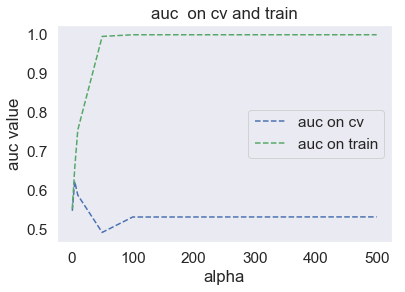

In [133]:
k = []#https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html
#https://stackoverflow.com/questions/38015181/accuracy-score-valueerror-cant-handle-mix-of-binary-and-continuous-target
#https://matplotlib.org/api/pyplot_api.html
#https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html
x = dc_tr[0:30000:]
y =  y_tr.values[0:30000] 
k = []
auc_cv = []
auc_tr = []
m = [1, 5, 10, 50, 100, 500]
for i in m:
    k.append(i)
    # instantiate learning model (k = 30)
    knn = DecisionTreeClassifier(max_depth=i,min_samples_split=5)
   
    knn.fit(x, y)

    
    pred = knn.predict(dc_cv[0:10000:])
    acc = accuracy_score(y_cv[0:10000:], pred, normalize=True) * float(100)
    print('\nCV accuracy for alpha = %f is %d%%' % (i, acc))
    
    
    
    
    probs = knn.predict_proba(dc_cv[0:10000])
    probs = probs[:, 1]
    auc = roc_auc_score(y_cv[0:10000], probs)
    print('auc on cv', auc)
    auc_cv.append(auc)
    
    probs1 = knn.predict_proba(dc_tr[0:30000])
    probs1 = probs1[:, 1]
    auc1 = roc_auc_score(y_tr[0:30000], probs1)
    print('auc on train',auc1)
    auc_tr.append(auc1)


plt.plot(k, auc_cv, 'b--', label='auc on cv')#   'rs',   'g^')
plt.plot(k,auc_tr, 'g--', label='auc on train')
plt.grid()
plt.ylabel("auc value")
plt.xlabel('alpha')
plt.title('auc  on cv and train')
plt.legend() # add legend based on line labels
plt.show()


**observations**
1. since i have taken very less points(500) there will be less auc and moreover there is about only 15% of 0 classlabels 
2. above count values says that hyperparametre is taken as 19 and auc on cv is 0.51

acc on test 83.34
auc on train 0.7475243474981907
auc on test 0.5119719063345892


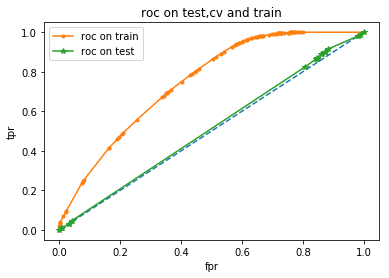

confision matrix on test
[[   40  2266]
 [  233 12461]]
2266
(2266, 710)


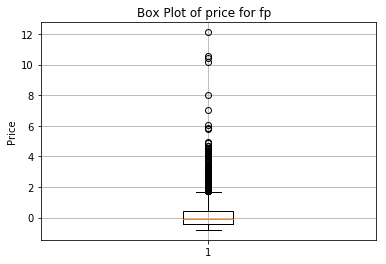

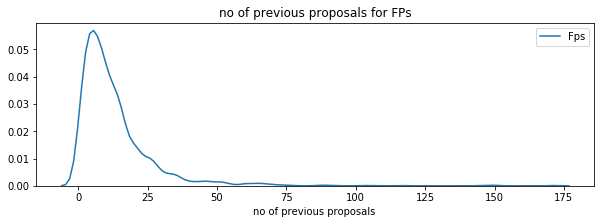

In [117]:
#https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html
#https://stackoverflow.com/questions/38015181/accuracy-score-valueerror-cant-handle-mix-of-binary-and-continuous-target
#https://matplotlib.org/api/pyplot_api.html
#https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html
x = dc_tr[0:30000:]
y =  y_tr.values[0:30000] 
knn = DecisionTreeClassifier(max_depth=10,min_samples_split=5)
   
knn.fit(x, y)



pred2 = knn.predict(dc_test[0:15000:])
acc2 = accuracy_score(y_test[0:15000:], pred2, normalize=True) * float(100)
print('acc on test' ,acc2)






probs1 = knn.predict_proba(dc_tr[0:30000])
probs1 = probs1[:, 1]
auc1 = roc_auc_score(y_tr[0:30000], probs1)
print('auc on train',auc1)

probs2 = knn.predict_proba(dc_test[0:15000])
probs2 = probs2[:, 1]
auc1 = roc_auc_score(y_test[0:15000], probs2)
print('auc on test',auc1)






fpr1, tpr1, thresholds1 = roc_curve(y_tr[0:30000], probs1)
fpr2, tpr2, thresholds2 = roc_curve(y_test[0:15000], probs2)


pyplot.plot([0, 1], [0, 1], linestyle='--')

pyplot.plot(fpr1, tpr1, marker='.', label='roc on train')
pyplot.plot(fpr2, tpr2, marker='*', label='roc on test')

plt.ylabel("tpr")
plt.xlabel('fpr')
plt.title('roc on test,cv and train')
plt.legend()
pyplot.show()


print('confision matrix on test')
data = confusion_matrix(y_test[0:15000], pred2)
df_cm = pd.DataFrame(data, columns=np.unique(y_test[0:15000]), index = np.unique(y_test[0:15000]))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, cmap="Blues", annot=True,annot_kws={"size": 16})# font size

print('confision matrix on train')
data = confusion_matrix(y_tr[0:30000], pred1)
df_cm = pd.DataFrame(data, columns=np.unique(y_tr[0:30000]), index = np.unique(y_tr[0:30000]))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, cmap="Blues", annot=True,annot_kws={"size": 16})# font size

p = dc_test[0:15000:][(y_test[0:15000] == 0) & (pred2.T == 1)]
dv = pd.DataFrame(p)
print(dv.shape)









plt.boxplot([dv[0].values])
plt.title('Box Plot of price for fp  ')
plt.ylabel('Price')
plt.grid()
plt.show()

plt.figure(figsize=(10,3))
sns.distplot(dv[1].values, hist=False, label="Fps")
plt.title('no of previous proposals for FPs')
plt.xlabel('no of previous proposals ')
plt.legend()
plt.show()




**observation**
1. from the above roc curves auc on train 0.64,auc on test 0.58,auc on cv 0.56
2. from above confusion matrix tp = 429 and fp = 71 

### C.4 Applying KNN brute force on TFIDF W2V,<font color='red'> SET 4</font>


CV accuracy for alpha = 1.000000 is 84%
auc on cv 0.5507644997443581
auc on train 0.5583208988072306

CV accuracy for alpha = 5.000000 is 84%
auc on cv 0.6244491027033349
auc on train 0.6646011024335507

CV accuracy for alpha = 10.000000 is 82%
auc on cv 0.5919388537044432
auc on train 0.773427915930268

CV accuracy for alpha = 50.000000 is 74%
auc on cv 0.5288339590649603
auc on train 0.9995082588182032

CV accuracy for alpha = 100.000000 is 74%
auc on cv 0.5376380139427437
auc on train 0.9995181812255832

CV accuracy for alpha = 500.000000 is 74%
auc on cv 0.534936669552745
auc on train 0.9995584333989149


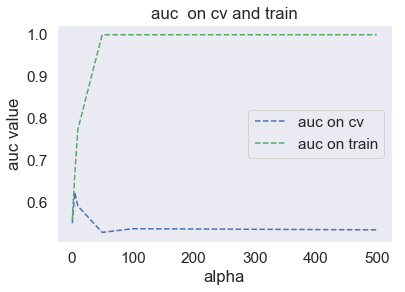

In [134]:
#https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html
#https://stackoverflow.com/questions/38015181/accuracy-score-valueerror-cant-handle-mix-of-binary-and-continuous-target
#https://matplotlib.org/api/pyplot_api.html
#https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html
x = dd_tr[0:30000:]
y =  y_tr.values[0:30000] 
k = []
auc_cv = []
auc_tr = []
m = [1, 5, 10, 50, 100, 500]
for i in m:
    k.append(i)
    # instantiate learning model (k = 30)
    knn = DecisionTreeClassifier(max_depth=i,min_samples_split=5)
   
    knn.fit(x, y)

    
    pred = knn.predict(dd_cv[0:10000:])
    acc = accuracy_score(y_cv[0:10000:], pred, normalize=True) * float(100)
    print('\nCV accuracy for alpha = %f is %d%%' % (i, acc))
    
    
    
    
    probs = knn.predict_proba(dd_cv[0:10000])
    probs = probs[:, 1]
    auc = roc_auc_score(y_cv[0:10000], probs)
    print('auc on cv', auc)
    auc_cv.append(auc)
    
    probs1 = knn.predict_proba(dd_tr[0:30000])
    probs1 = probs1[:, 1]
    auc1 = roc_auc_score(y_tr[0:30000], probs1)
    print('auc on train',auc1)
    auc_tr.append(auc1)


plt.plot(k, auc_cv, 'b--', label='auc on cv')#   'rs',   'g^')
plt.plot(k,auc_tr, 'g--', label='auc on train')
plt.grid()
plt.ylabel("auc value")
plt.xlabel('alpha')
plt.title('auc  on cv and train')
plt.legend() # add legend based on line labels
plt.show()


**observations**
1. since i have taken very less points(500) there will be less auc and moreover there is about only 15% of 0 classlabels 
2. above count values says that hyperparametre is taken as 11 and auc on cv is 0.53

acc on test 45.34666666666667
auc on train 0.7819373744232017
auc on test 0.5194491978850768


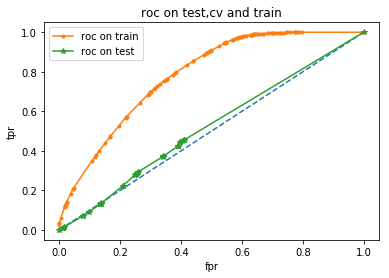

confision matrix on test
[[1404  902]
 [7296 5398]]
902
(902, 710)


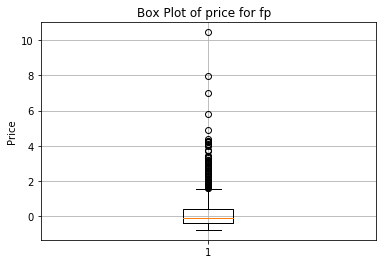

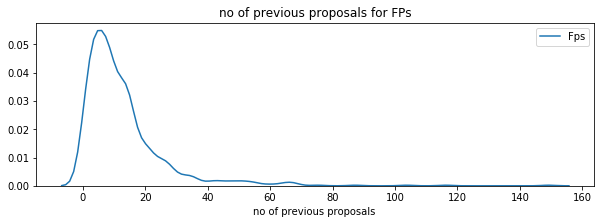

In [119]:
#https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html
#https://stackoverflow.com/questions/38015181/accuracy-score-valueerror-cant-handle-mix-of-binary-and-continuous-target
#https://matplotlib.org/api/pyplot_api.html
#https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html
x = dd_tr[0:30000:]
y =  y_tr.values[0:30000] 
knn = DecisionTreeClassifier(max_depth=10,min_samples_split=5)
   
knn.fit(x, y)



pred2 = knn.predict(dd_test[0:15000:])
acc2 = accuracy_score(y_test[0:15000:], pred2, normalize=True) * float(100)
print('acc on test' ,acc2)






probs1 = knn.predict_proba(dd_tr[0:30000])
probs1 = probs1[:, 1]
auc1 = roc_auc_score(y_tr[0:30000], probs1)
print('auc on train',auc1)

probs2 = knn.predict_proba(dd_test[0:15000])
probs2 = probs2[:, 1]
auc1 = roc_auc_score(y_test[0:15000], probs2)
print('auc on test',auc1)






fpr1, tpr1, thresholds1 = roc_curve(y_tr[0:30000], probs1)
fpr2, tpr2, thresholds2 = roc_curve(y_test[0:15000], probs2)


pyplot.plot([0, 1], [0, 1], linestyle='--')

pyplot.plot(fpr1, tpr1, marker='.', label='roc on train')
pyplot.plot(fpr2, tpr2, marker='*', label='roc on test')

plt.ylabel("tpr")
plt.xlabel('fpr')
plt.title('roc on test,cv and train')
plt.legend()
pyplot.show()

print('confision matrix on test')
data = confusion_matrix(y_test[0:15000], pred2)
df_cm = pd.DataFrame(data, columns=np.unique(y_test[0:15000]), index = np.unique(y_test[0:15000]))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, cmap="Blues", annot=True,annot_kws={"size": 16})# font size

print('confision matrix on train')
data = confusion_matrix(y_tr[0:30000], pred1)
df_cm = pd.DataFrame(data, columns=np.unique(y_tr[0:30000]), index = np.unique(y_tr[0:30000]))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, cmap="Blues", annot=True,annot_kws={"size": 16})# font size


p = dd_test[0:15000:][(y_test[0:15000] == 0) & (pred2.T == 1)]
dv = pd.DataFrame(p)
print(dv.shape)









plt.boxplot([dv[0].values])
plt.title('Box Plot of price for fp  ')
plt.ylabel('Price')
plt.grid()
plt.show()

plt.figure(figsize=(10,3))
sns.distplot(dv[1].values, hist=False, label="Fps")
plt.title('no of previous proposals for FPs')
plt.xlabel('no of previous proposals ')
plt.legend()
plt.show()




**observation**
1. from the above roc curves auc on train 0.64,auc on test 0.58,auc on cv 0.56
2. from above confusion matrix tp = 429 and fp = 71 

# apply slectkbest

In [135]:
x = db_tr[0:30000:]
y =  y_tr.values[0:30000] 
knn = DecisionTreeClassifier(max_depth=None,min_samples_split=2)
   
knn.fit(x, y)
imp = knn.feature_importances_

In [136]:
np.sort(imp)

array([0.        , 0.        , 0.        , ..., 0.01301233, 0.01379863,
       0.01399484])

In [137]:
ind2 = np.argpartition(imp, -5000)[-5000:]
ind2

array([ 1772,  1773,  1771, ...,  7020,  6987, 14901])

In [203]:
db_tr = db_tr.todok()

In [204]:
db1_tr = pd.DataFrame(db_tr)
db1_tr = db_tr.loc[:, db1_tr.columns.isin(ind2)]

ValueError: If using all scalar values, you must pass an index

In [181]:
db1_cv = pd.DataFrame(db_cv)
db1_cv = db1_cv.loc[:, db1_cv.columns.isin(ind2)]

In [ ]:
db1_test = pd.DataFrame(db_test)
db1_test = db1_test.loc[:, db1_test.columns.isin(ind2)]


In [ ]:
print(db1_tr.shape)
print(db1_cv.shape)
print(db1_test.shape)

In [ ]:
#https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html
#https://stackoverflow.com/questions/38015181/accuracy-score-valueerror-cant-handle-mix-of-binary-and-continuous-target
#https://matplotlib.org/api/pyplot_api.html
#https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html
x = db1_tr[0:30000:]
y =  y_tr.values[0:30000] 
k = []
auc_cv = []
auc_tr = []
m = [1, 5, 10, 50, 100, 500]
for i in m:
    k.append(i)
    # instantiate learning model (k = 30)
    knn = DecisionTreeClassifier(max_depth=i,min_samples_split=5)
   
    knn.fit(x, y)

    
    pred = knn.predict(db1_cv[0:10000:])
    acc = accuracy_score(y_cv[0:10000:], pred, normalize=True) * float(100)
    print('\nCV accuracy for alpha = %f is %d%%' % (i, acc))
    
    
    
    
    probs = knn.predict_proba(db1_cv[0:10000])
    probs = probs[:, 1]
    auc = roc_auc_score(y_cv[0:10000], probs)
    print('auc on cv', auc)
    auc_cv.append(auc)
    
    probs1 = knn.predict_proba(db1_tr[0:30000])
    probs1 = probs1[:, 1]
    auc1 = roc_auc_score(y_tr[0:30000], probs1)
    print('auc on train',auc1)
    auc_tr.append(auc1)


plt.plot(k, auc_cv, 'b--', label='auc on cv')#   'rs',   'g^')
plt.plot(k,auc_tr, 'g--', label='auc on train')
plt.grid()
plt.ylabel("auc value")
plt.xlabel('alpha')
plt.title('auc  on cv and train')
plt.legend() # add legend based on line labels
plt.show()


**observations**
1. since i have taken very less points(500) there will be less auc and moreover there is about only 15% of 0 classlabels 
2. above count values says that hyperparametre is taken as 11 and auc on cv is 0.51

In [ ]:
#https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html
#https://stackoverflow.com/questions/38015181/accuracy-score-valueerror-cant-handle-mix-of-binary-and-continuous-target
#https://matplotlib.org/api/pyplot_api.html
#https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html
x = db1_tr[0:30000:]
y =  y_tr.values[0:30000] 
knn = DecisionTreeClassifier(max_depth=10,min_samples_split=5)
   
knn.fit(x, y)



pred2 = knn.predict(db1_test[0:15000:])
acc2 = accuracy_score(y_test[0:15000:], pred2, normalize=True) * float(100)
print('acc on test' ,acc2)






probs1 = knn.predict_proba(db1_tr[0:30000])
probs1 = probs1[:, 1]
auc1 = roc_auc_score(y_tr[0:30000], probs1)
print('auc on train',auc1)

probs2 = knn.predict_proba(db1_test[0:15000])
probs2 = probs2[:, 1]
auc1 = roc_auc_score(y_test[0:15000], probs2)
print('auc on test',auc1)






fpr1, tpr1, thresholds1 = roc_curve(y_tr[0:30000], probs1)
fpr2, tpr2, thresholds2 = roc_curve(y_test[0:15000], probs2)


pyplot.plot([0, 1], [0, 1], linestyle='--')

pyplot.plot(fpr1, tpr1, marker='.', label='roc on train')
pyplot.plot(fpr2, tpr2, marker='*', label='roc on test')

plt.ylabel("tpr")
plt.xlabel('fpr')
plt.title('roc on test,cv and train')
plt.legend()
pyplot.show()


print('confision matrix on test')
data = confusion_matrix(y_test[0:15000], pred2)
df_cm = pd.DataFrame(data, columns=np.unique(y_test[0:15000]), index = np.unique(y_test[0:15000]))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, cmap="Blues", annot=True,annot_kws={"size": 16})# font size

print('confision matrix on train')
data = confusion_matrix(y_tr[0:30000], pred1)
df_cm = pd.DataFrame(data, columns=np.unique(y_tr[0:30000]), index = np.unique(y_tr[0:30000]))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, cmap="Blues", annot=True,annot_kws={"size": 16})# font size

p = db1_test[0:15000:].values[(y_test[0:15000].values == 0) & (pred2.T == 1)]
dv = pd.DataFrame(p)
print(dv.shape)









plt.boxplot([dv[0].values])
plt.title('Box Plot of price for fp  ')
plt.ylabel('Price')
plt.grid()
plt.show()

plt.figure(figsize=(10,3))
sns.distplot(dv[1].values, hist=False, label="Fps")
plt.title('no of previous proposals for FPs')
plt.xlabel('no of previous proposals ')
plt.legend()
plt.show()




**observation**
1. from the above roc curves auc on train 0.96,auc on test 0.50,auc on cv 0.51
2. from above confusion matrix tp = 429 and fp = 71 
3. The auc on train 0.96 because we have taken highest 2000 features 

In [ ]:
#https://stackoverflow.com/questions/18272160/access-multiple-elements-of-list-knowing-their-index
from operator import itemgetter 

f4 = itemgetter(*ind2)(f3)

In [ ]:
#https://towardsdatascience.com/how-to-visualize-a-decision-tree-from-a-random-forest-in-python-using-scikit-learn-38ad2d75f21c

from sklearn import tree
x = db1_tr[0:30000:]
y =  y_tr.values[0:30000] 
knn = DecisionTreeClassifier(max_depth=10,min_samples_split=5)
knn.fit(x, y)
tree.export_graphviz(knn,out_file='tree.dot',feature_names=f4)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])
from IPython.display import Image
Image(filename = 'tree.png')

# summary

In [ ]:
#http://zetcode.com/python/prettytable/
from prettytable import PrettyTable
    
x = PrettyTable()

x.field_names = ["vectorizer", "model", "hyper parameter", "Auc%"]

x.add_row(["Bow", 'brute', 17,63 ])
x.add_row(["Tfidf", 'brute',27 ,56 ])
x.add_row(["w2v", 'brute', 19,51 ])
x.add_row(["thidfw2c", 'brute',11 ,53])


print(x)
